In [ ]:
!pip install mediapipe


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 7.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.4 which is incompatible.


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import time
import mediapipe as mp
import math
import matplotlib.pyplot as plt
from mediapipe.tasks.python.components.containers import landmark as landmark_module
from mediapipe import solutions
from mediapipe.framework.formats import landmark_pb2
import mediapipe as mp
from typing import List, Tuple, Union, Mapping, Optional


mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles


#  if not results.multi_hand_world_landmarks:
#       continue
#     for hand_world_landmarks in results.multi_hand_world_landmarks:
#       mp_drawing.plot_landmarks(
#         hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)

BaseOptions = mp.tasks.BaseOptions
HandLandmarker = mp.tasks.vision.HandLandmarker
HandLandmarkerOptions = mp.tasks.vision.HandLandmarkerOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

MARGIN = 10  # pixels
FONT_SIZE = 1
FONT_THICKNESS = 1
HANDEDNESS_TEXT_COLOR = (88, 205, 54)

indices_to_keep = [0, 2, 5, 7, 8, 11, 12, 13, 14, 15, 16, 23, 24]
#                  0  1  2  3  4  5   6   7   8   9   10  11 12


POSE_CONNECTIONS = frozenset([(0,1),(0,2),(1,3),(2,4),(5,6),(6,8),(8,10),
                              (5,7),(7,9),(5,11),(6,12),(11,12)])


def extract_keypoints_and_bbox(hand_landmarks):
    x_min = min([lm.x for lm in hand_landmarks])
    y_min = min([lm.y for lm in hand_landmarks])
    x_max = max([lm.x for lm in hand_landmarks])
    y_max = max([lm.y for lm in hand_landmarks])

    width = x_max - x_min
    height = y_max - y_min
    bbox = (x_min, y_min, width, height)

    keypoints = [(lm.x, lm.y) for lm in hand_landmarks]

    return keypoints, bbox

def ensure_hands_order(hand_landmarks, handedness):
    """
    Sắp xếp tay sao cho tay phải luôn đứng trước tay trái.
    Nếu thiếu tay, thêm tay giả với tất cả tọa độ là 0.
    """
    # Sắp xếp tay theo handedness
    best_hands = {'Right': (None, -1), 'Left': (None, -1)}
    #print(handedness)
    # Iterate through handedness and hand_landmarks together
    for idx, (landmarks, hand_info) in enumerate(zip(hand_landmarks, handedness)):
        for category in hand_info:
            if category.category_name in best_hands:
                _, best_score = best_hands[category.category_name]
                if category.score > best_score:
                    best_hands[category.category_name] = (landmarks, category.score)

    # Preparing the ordered landmarks list
    ordered_landmarks = []

    # Append the best right hand if found, otherwise append an empty hand
    if best_hands['Right'][0] is not None:
        ordered_landmarks.append(best_hands['Right'][0])
    else:
        ordered_landmarks.append(create_empty_hand())

    # Append the best left hand if found, otherwise append an empty hand
    if best_hands['Left'][0] is not None:
        ordered_landmarks.append(best_hands['Left'][0])
    else:
        ordered_landmarks.append(create_empty_hand())

    return ordered_landmarks

def create_empty_hand():
    #Tạo một tay giả với tất cả tọa độ x, y, z là 0
    empty_landmarks = [
        landmark_module.NormalizedLandmark(x=0, y=0, z=0, visibility=0.0, presence=0.0)
        for _ in range(21)
    ]
    return empty_landmarks


def draw_hand_landmarks_on_image(rgb_image, detection_result):
  hand_landmarks_list = detection_result
  annotated_image = np.copy(rgb_image)

  # Loop through the detected hands to visualize.
  for idx in range(len(hand_landmarks_list)):
    hand_landmarks = hand_landmarks_list[idx]

    # Draw the hand landmarks.
    hand_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    hand_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in hand_landmarks
    ])
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      hand_landmarks_proto,
      solutions.hands.HAND_CONNECTIONS,
      solutions.drawing_styles.get_default_hand_landmarks_style(),
      solutions.drawing_styles.get_default_hand_connections_style())

  plt.imshow(annotated_image)
  plt.show()
  return annotated_image


def filter_pose_landmarks(pose_detection_result):
    # Indices of landmarks to extract
    indices_to_extract = [0, 2, 5, 7, 8, 11, 12, 13, 14, 15, 16, 23, 24]

    # Check if the pose detection result has landmarks
    if not pose_detection_result.pose_landmarks:
        return []

    # Filter the landmarks based on the specified indices
    filtered_landmarks = [
        pose_detection_result.pose_landmarks[0][idx]
        for idx in indices_to_extract
    ]

    return filtered_landmarks

def draw_pose_landmarks_on_image(rgb_image, detection_result):
  pose_landmarks_list = [detection_result]
  annotated_image = np.copy(rgb_image)

  # Loop through the detected poses to visualize.
  for idx in range(len(pose_landmarks_list)):
    pose_landmarks = pose_landmarks_list[idx]
    pose_landmarks_proto = landmark_pb2.NormalizedLandmarkList()
    pose_landmarks_proto.landmark.extend([
      landmark_pb2.NormalizedLandmark(x=landmark.x, y=landmark.y, z=landmark.z) for landmark in pose_landmarks
    ])
    # Draw the pose landmarks.
    solutions.drawing_utils.draw_landmarks(
      annotated_image,
      pose_landmarks_proto,
      POSE_CONNECTIONS,
      solutions.drawing_styles.get_default_pose_landmarks_style())
  return annotated_image


def process(input_path):
    is_video = input_path.lower().endswith(('.mp4', '.avi', '.mov'))
    results = []
    options1 = PoseLandmarkerOptions(
            base_options=BaseOptions(model_asset_path='/content/pose_landmarker_full.task'),
            running_mode=VisionRunningMode.IMAGE, num_poses = 1, min_pose_detection_confidence = 0.5, min_pose_presence_confidence = 0.5)
    pose_detector = PoseLandmarker.create_from_options(options1)

    if is_video:
        # Xử lý video
        options = HandLandmarkerOptions(
            base_options=BaseOptions(model_asset_path='hand_landmarker.task'),
            running_mode=VisionRunningMode.VIDEO, num_hands=6, min_hand_detection_confidence = 0.1, min_hand_presence_confidence = 0.1, min_tracking_confidence = 0.65)

        with HandLandmarker.create_from_options(options) as landmarker:
            cap = cv2.VideoCapture(input_path)
            frame_rate = cap.get(cv2.CAP_PROP_FPS)
            frame_timestamp_ms = 0
            a = 0
            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break
                frame_result = {}
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame_rgb)
                pose_detection_result = pose_detector.detect(mp_image)
                if pose_detection_result.pose_landmarks:
                    #print(pose_detection_result)
                    pose_detection_result = filter_pose_landmarks(pose_detection_result)
                    #print(pose_detection_result)
                    # Đảm bảo thứ tự tay và xử lý normalize
                    result_hand = landmarker.detect_for_video(mp_image, frame_timestamp_ms)
                    ordered_hand_landmarks = ensure_hands_order(result_hand.hand_landmarks, result_hand.handedness)
                    #print(ordered_hand_landmarks)
                    frame_result['hand_landmarks'] = ordered_hand_landmarks
                    frame_result['pose_landmarks'] = pose_detection_result
                    results.append(frame_result)
                    image = mp_image.numpy_view()
                    annotated_image = draw_pose_landmarks_on_image(image,  pose_detection_result)
                    annotated_image= draw_hand_landmarks_on_image(annotated_image, ordered_hand_landmarks)
                    a +=1

                frame_timestamp_ms += int(1000 / frame_rate)
            print(a)
            cap.release()

    else:
        # Xử lý ảnh
        options = HandLandmarkerOptions(
            base_options=BaseOptions(model_asset_path='hand_landmarker.task'),
            running_mode=VisionRunningMode.IMAGE,num_hands=6, min_hand_detection_confidence = 0.1, min_hand_presence_confidence = 0.1, min_tracking_confidence = 0.65 )
        with HandLandmarker.create_from_options(options) as landmarker:
            mp_image = mp.Image.create_from_file(input_path)
            #mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=image_rgb) # Đọc từ một numpy array ảnh

            result = landmarker.detect(mp_image)
            print(result)
            pose_detection_result = pose_detector.detect(mp_image)
            print(pose_detection_result)
            frame_result = {}
            #print(result)

            handedness_categories = {category.category_name for hand_info in result.handedness for category in hand_info}
            if 'Left' in handedness_categories and 'Right' in handedness_categories:
                ordered_hand_landmarks = ensure_hands_order(result.hand_landmarks, result.handedness)
                frame_result['hand_landmarks'] = ordered_hand_landmarks
                results.append(frame_result)
                image = mp_image.numpy_view()
                image = image[:, :, :3]
                if pose_detection_result.pose_landmarks:
                    pose_detection_result = filter_pose_landmarks(pose_detection_result)
                    frame_result['pose_landmarks'] = pose_detection_result
                    print(image.shape)
                    annotated_image = draw_pose_landmarks_on_image(image,  pose_detection_result)
                else:
                  annotated_imagee = image
                annotated_image= draw_hand_landmarks_on_image(annotated_image, ordered_hand_landmarks)

    return results



In [ ]:
import numpy as np

def normalize_hand_landmarks(hand_landmarks):
    # Chia tay trái và phải
    left_hand = hand_landmarks[1] if len(hand_landmarks) > 1 else []
    right_hand = hand_landmarks[0] if len(hand_landmarks) > 0 else []

    def normalize_single_hand(hand):
        if not hand:
            return np.zeros(21*2)  # Nếu không có tay, trả về array toàn số 0

        # Lấy giá trị x và y từ landmarks
        landmarks_x_values = [lm.x for lm in hand]
        landmarks_y_values = [lm.y for lm in hand]

        # Tính toán bounding box dựa trên chiều rộng và chiều cao
        width = max(landmarks_x_values) - min(landmarks_x_values)
        height = max(landmarks_y_values) - min(landmarks_y_values)

        # Thiết lập delta_x và delta_y theo tỉ lệ width và height
        if width > height:
            delta_x = 0.3 * width
            delta_y = delta_x + ((width - height) / 2)*0.2
        else:
            delta_y = 0.3 * height
            delta_x = delta_y + ((height - width) / 2)*0.2


        # Điểm bắt đầu và kết thúc của bounding box để chuẩn hóa
        starting_point = [min(landmarks_x_values) - delta_x, min(landmarks_y_values) - delta_y]
        ending_point = [max(landmarks_x_values) + delta_x, max(landmarks_y_values) + delta_y]

        # Chuẩn hóa các điểm landmarks
        normalized_landmarks = []
        for lm in hand:
            if (ending_point[0] - starting_point[0]) == 0 or (starting_point[1] - ending_point[1]) == 0:
                normalized_landmarks.append((0.0,0.0))
                continue
            normalized_x = (lm.x - starting_point[0]) / (ending_point[0] - starting_point[0])
            normalized_y = (lm.y - ending_point[1]) / (starting_point[1] - ending_point[1])
            normalized_landmarks.append((normalized_x, normalized_y))

        return np.array(normalized_landmarks).flatten(), [starting_point, ending_point]


    # Chuẩn hóa tay trái và phải
    left_normalized, point1 = normalize_single_hand(left_hand)
    right_normalized, point2 = normalize_single_hand(right_hand)

    # Trả về kết quả đã chuẩn hóa
    return np.concatenate([right_normalized, left_normalized]), [point1, point2]
    #return [right_normalized, left_normalized], [point1, point2]

def normalize_pose_landmarks(pose_landmarks):

    landmarks_x_values = [lm.x for lm in pose_landmarks]
    landmarks_y_values = [lm.y for lm in pose_landmarks]

    # Lấy vị trí của vai trái (left_shoulder) và vai phải (right_shoulder)
    left_shoulder = (pose_landmarks[5].x, pose_landmarks[5].y)
    right_shoulder = (pose_landmarks[6].x, pose_landmarks[6].y)

    # Tính khoảng cách giữa vai trái và vai phải
    shoulder_distance = (((left_shoulder[0] - right_shoulder[0]) ** 2) +
                         ((left_shoulder[1] - right_shoulder[1]) ** 2)) ** 0.5
    head_metric = shoulder_distance

    # Tính toán starting_point và ending_point dựa trên thông tin neck và mắt trái
    neck_x = (pose_landmarks[5].x + pose_landmarks[6].x) / 2  # Giả sử cổ nằm giữa hai vai
    #print("neck", neck_x)
    left_eye_y = pose_landmarks[1].y


    starting_point = [neck_x - 3 * head_metric, left_eye_y - (head_metric)]
    ending_point = [neck_x + 3 * head_metric , starting_point[1] +  6 * head_metric]
  #print([starting_point[0], ending_point[0]])

    # Chuẩn hóa các điểm landmarks
    normalized_landmarks = []
    for lm in pose_landmarks:
        normalized_x = (lm.x - starting_point[0]) / (ending_point[0] - starting_point[0])
        normalized_y = (lm.y - ending_point[1]) / (starting_point[1] - ending_point[1])
        normalized_landmarks.append((normalized_x, normalized_y))

    return np.array(normalized_landmarks).flatten(), [starting_point, ending_point]

def normalize_landmarks(results):
    all_frames_normalized = []

    for frame_result in results:
        hand_normalized,a = normalize_hand_landmarks(frame_result['hand_landmarks'])
        pose_normalized,b = normalize_pose_landmarks(frame_result['pose_landmarks'])

        frame_normalized = np.concatenate([hand_normalized, pose_normalized])
        all_frames_normalized.append(frame_normalized)

    return np.array(all_frames_normalized)

In [ ]:
!wget -q -O image.jpg https://storage.googleapis.com/mediapipe-tasks/hand_landmarker/woman_hands.jpg
!wget -q https://storage.googleapis.com/mediapipe-models/hand_landmarker/hand_landmarker/float16/1/hand_landmarker.task
img = cv2.imread("image.jpg")

(1272, 727)


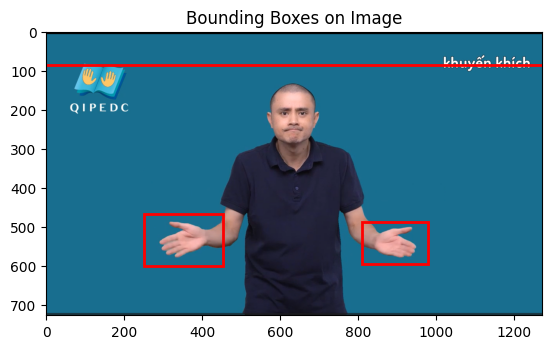

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

image = Image.open("/content/khuyenkhich.png")
image_width, image_height = image.size
print(image.size)

# Chuyển đổi ảnh thành mảng numpy
image_np = np.array(image)

# Tạo hình ảnh
fig, ax = plt.subplots()
ax.imshow(image_np)

# Vẽ các điểm đã được chuẩn hóa
for bbox in c:
    starting_point = bbox[0]
    ending_point = bbox[1]

    # Chuyển đổi tọa độ chuẩn hóa về tọa độ thực
    starting_point_real = (starting_point[0] * image_width , starting_point[1] * image_height)
    ending_point_real = (ending_point[0] * image_width, ending_point[1] * image_height)

    # Vẽ hình chữ nhật cho bounding box
    width = ending_point_real[0] - starting_point_real[0]
    height = ending_point_real[1] - starting_point_real[1]
    rect = patches.Rectangle(starting_point_real, width, height, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)


starting_point1 = e[0]
ending_point1 = e[1]

    # Chuyển đổi tọa độ chuẩn hóa về tọa độ thực
starting_point_real1 = (starting_point1[0] * image_width , starting_point1[1] * image_height)
ending_point_real1 = (ending_point1[0] * image_width, ending_point1[1] * image_height)

    # Vẽ hình chữ nhật cho bounding box
width1 = ending_point_real1[0] - starting_point_real1[0]
height1 = ending_point_real1[1] - starting_point_real1[1]
rect = patches.Rectangle(starting_point_real1, width1, height1, linewidth=2, edgecolor='r', facecolor='none')
ax.add_patch(rect)

# Hiển thị hình ảnh
plt.title("Bounding Boxes on Image")

plt.show()

In [ ]:
def plot_normalized_landmarks(normalized_landmarks, bounding_box):
    # Tạo hình ảnh mới
    plt.figure(figsize=(6, 6))



    # Vẽ các điểm chuẩn hóa
    normalized_x = normalized_landmarks[0::2]
    normalized_y = normalized_landmarks[1::2]
    plt.scatter(normalized_x, normalized_y, color='blue', label='Normalized Landmarks')

    # Vẽ các điểm gốc

    # Cài đặt tiêu đề và nhãn
    plt.title('Normalized Hand Landmarks')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.xlim(-0.5, 1.5)
    plt.ylim(-0.5, 1.5)
    plt.axhline(0, color='black', linewidth=0.5, ls='--')
    plt.axvline(0, color='black', linewidth=0.5, ls='--')
    plt.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')

    # Đảo ngược trục y để khớp với hệ tọa độ của hình ảnh

    # Hiển thị hình ảnh
    plt.show()


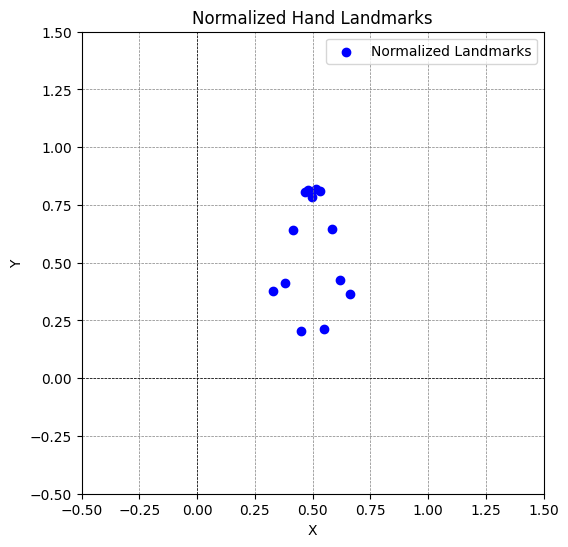

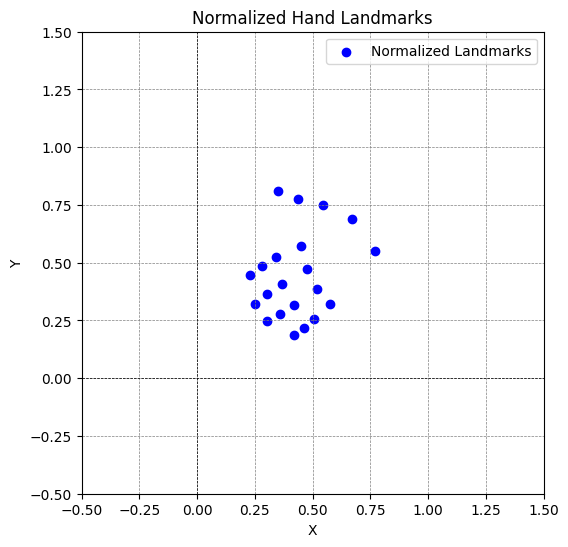

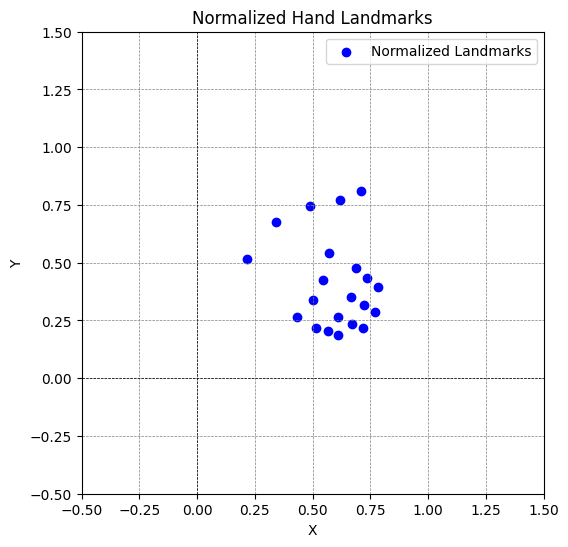

[0.77185407 0.54929644 0.67190752 0.68726901 0.54417745 0.75079662
 0.43670855 0.77530872 0.35160635 0.8125     0.45200064 0.5728005
 0.33971546 0.52393479 0.28060878 0.48487899 0.22814593 0.44650105
 0.47475857 0.47115678 0.36774767 0.40694933 0.30301811 0.36351571
 0.25020956 0.32264063 0.51782877 0.38784654 0.41955233 0.31736372
 0.35936508 0.27809364 0.30453225 0.2460307  0.57498048 0.31926324
 0.50521813 0.25595651 0.46160932 0.21861237 0.41962173 0.1875    ]


In [ ]:
plot_normalized_landmarks(d, e)
plot_normalized_landmarks(b[0], c[0])
plot_normalized_landmarks(b[1], c[1])
print(b[0])

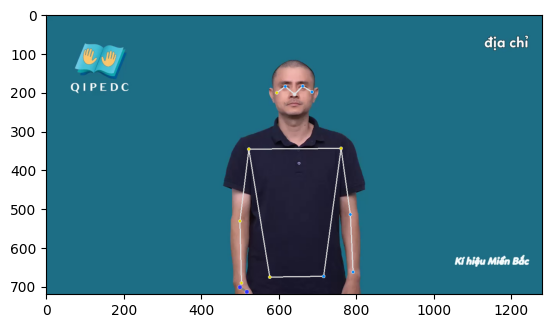

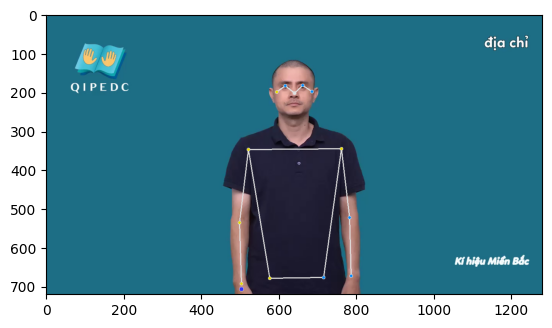

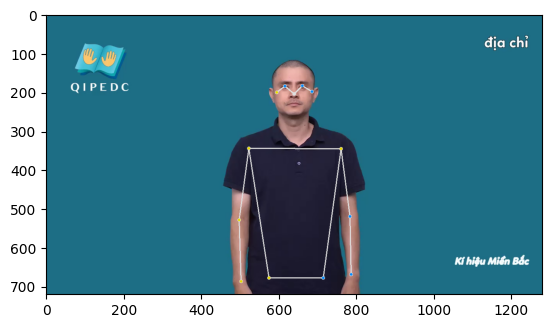

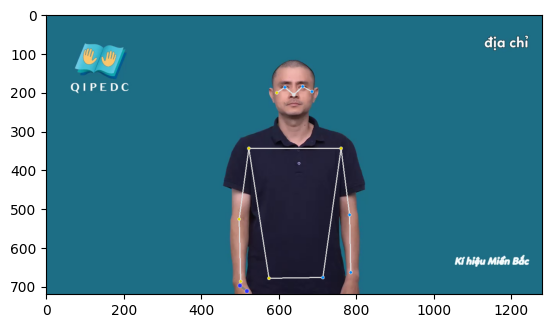

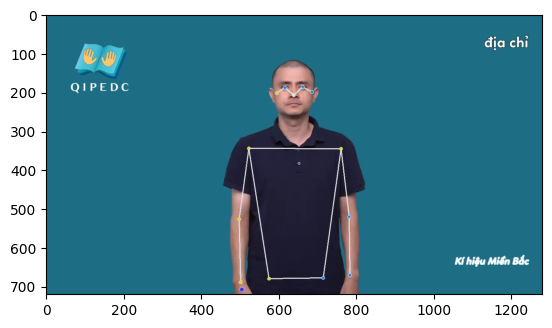

...

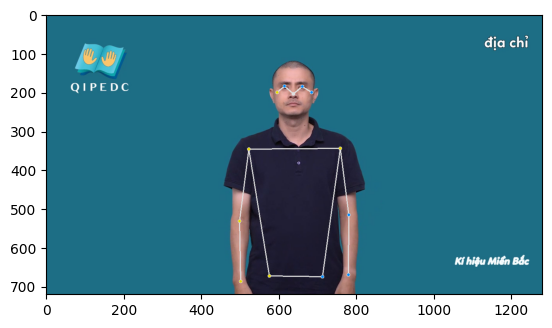

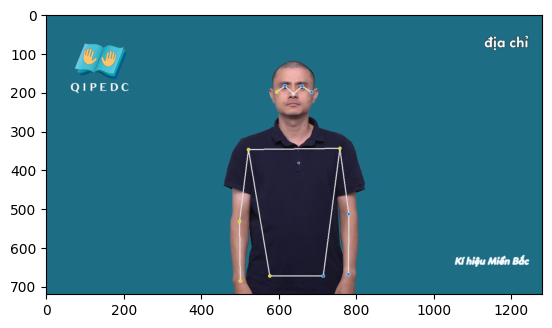

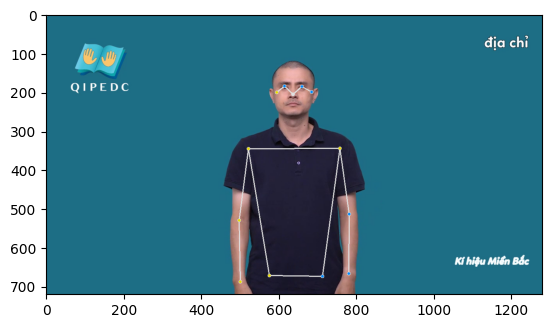

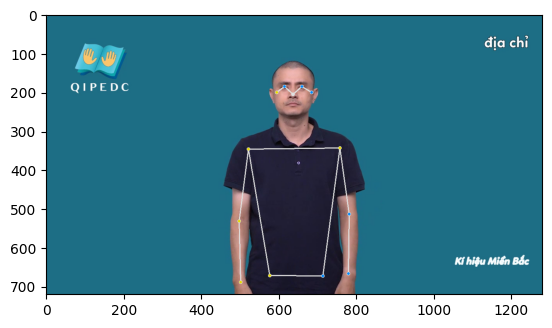

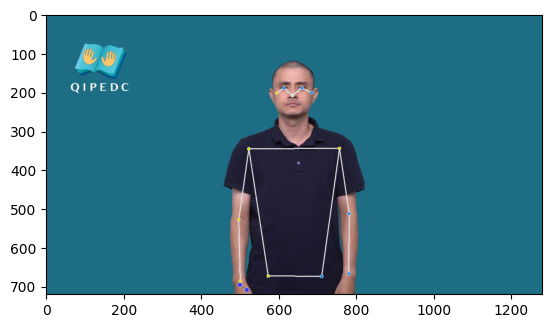

130


In [ ]:
x_process = process('/content/video_0.mp4')

In [ ]:
#print(x_process[0])
print(len(x_process))

130


In [ ]:
b, c = normalize_hand_landmarks(x_process[2]['hand_landmarks'])

In [ ]:
print(landmark_module.NormalizedLandmark(x=0, y=0, z=0, visibility=0.0, presence=0.0))

NormalizedLandmark(x=0, y=0, z=0, visibility=0.0, presence=0.0)


In [ ]:
import random


#in plain rotation


def augment_in_plain_rotation(results, max_angle_degrees=4):
    angle_degrees = np.random.uniform(-max_angle_degrees, max_angle_degrees)
    angle_radians = np.deg2rad(angle_degrees)

    augmented_results = []

    for frame_result in results:
        augmented_frame_result = {}

        def rotate_landmark(landmark):
            x, y = landmark.x , landmark.y
            px, py = x - 0.5, y - 0.5
            new_x = px * np.cos(angle_radians) - py * np.sin(angle_radians) + 0.5
            new_y = px * np.sin(angle_radians) + py * np.cos(angle_radians) + 0.5
            return landmark_module.NormalizedLandmark(x=new_x, y=new_y, z=landmark.z, visibility=landmark.visibility, presence=landmark.presence)

        # Apply rotation to hand_landmarks and pose_landmarks
        rotated_hands = [[rotate_landmark(landmark) for landmark in hand] for hand in frame_result['hand_landmarks']]
        rotated_pose = [rotate_landmark(landmark) for landmark in frame_result['pose_landmarks']]

        augmented_frame_result['hand_landmarks'] = rotated_hands
        augmented_frame_result['pose_landmarks'] = rotated_pose

        augmented_results.append(augmented_frame_result)

    return augmented_results


def augment_in_plain_rotation_diff(results, max_angle_degrees = 8, max_angle_degrees_body = 3):
    angle_degrees_hand = np.random.uniform(-max_angle_degrees, max_angle_degrees)
    print(angle_degrees_hand)
    angle_degress_body = np.random.uniform(-max_angle_degrees_body, max_angle_degrees_body)
    print(angle_degress_body)
    angle_radians_hand = np.deg2rad(angle_degrees_hand)
    angle_radians_body = np.deg2rad(angle_degress_body)

    augmented_results = []

    for frame_result in results:
        augmented_frame_result = {}

        def rotate_landmark(landmark, angle):
            x, y = landmark.x , landmark.y
            px, py = x - 0.5, y - 0.5
            new_x = px * np.cos(angle) - py * np.sin(angle) + 0.5
            new_y = px * np.sin(angle) + py * np.cos(angle) + 0.5
            return landmark_module.NormalizedLandmark(x=new_x, y=new_y, z=landmark.z, visibility=landmark.visibility, presence=landmark.presence)

        # Apply rotation to hand_landmarks and pose_landmarks
        rotated_hands = [[rotate_landmark(landmark, angle_radians_hand) for landmark in hand] for hand in frame_result['hand_landmarks']]
        rotated_pose = [rotate_landmark(landmark, angle_radians_body) for landmark in frame_result['pose_landmarks']]
        augmented_frame_result['hand_landmarks'] = rotated_hands
        augmented_frame_result['pose_landmarks'] = rotated_pose

        augmented_results.append(augmented_frame_result)

    return augmented_results



#Squeeze


def augment_squeeze(results, squeeze_ratio=(0.05, 0.1)):
    augmented_results = []

    for frame_result in results:
        move_left = np.random.uniform(*squeeze_ratio)
        move_right = np.random.uniform(*squeeze_ratio)

        # Create the transformation matrix for squeezing
        src = np.array([[0, 1], [1, 1], [0, 0], [1, 0]], dtype=np.float32)
        dest = np.array([[0 + move_left, 1], [1 - move_right, 1], [0 + move_left, 0], [1 - move_right, 0]],
                        dtype=np.float32)
        matrix = cv2.getPerspectiveTransform(src, dest)

        def apply_perspective_transform(landmarks):
            points = np.array([[landmark.x, landmark.y] for landmark in landmarks], dtype=np.float32)
            transformed_points = cv2.perspectiveTransform(points[np.newaxis, :, :], matrix)[0]
            augmented_zero_landmark = cv2.perspectiveTransform(np.array([[[0, 0]]], dtype=np.float32), matrix)[0][0]
            augmented_landmarks = np.stack([np.where(sub == augmented_zero_landmark, [0, 0], sub) for sub in transformed_points])
            return [landmark_module.NormalizedLandmark(x=p[0], y=p[1], z=landmark.z, visibility=landmark.visibility, presence=landmark.presence) for p, landmark in zip(augmented_landmarks, landmarks)]

        # Apply squeeze transform to hand_landmarks and pose_landmarks
        transformed_hands = frame_result['hand_landmarks']
        transformed_pose = apply_perspective_transform(frame_result['pose_landmarks'])

        # Store the augmented results
        augmented_frame_result = {
            'hand_landmarks': transformed_hands,
            'pose_landmarks': transformed_pose
        }
        augmented_results.append(augmented_frame_result)

    return augmented_results



def augment_perspective_transformation(results, perspective_ratio=(0.05, 0.15)):
    augmented_results = []

    for frame_result in results:
        move_ratio = np.random.uniform(*perspective_ratio)

        # Create the transformation matrix for perspective transformation
        src = np.array([[0, 1], [1, 1], [0, 0], [1, 0]], dtype=np.float32)

        if np.random.rand() > 0.5:
            dest = np.array([[move_ratio, 1 - move_ratio], [1, 1], [move_ratio, move_ratio], [1, 0]],
                            dtype=np.float32)
        else:
            #dest = np.array([[0 + move_left, 1], [1 - move_right, 1], [0 + move_left, 0], [1 - move_right, 0]],dtype=np.float32)
            dest = np.array([[0, 1], [1 - move_ratio, 1 - move_ratio], [0, 0], [1 - move_ratio, move_ratio]],
                            dtype=np.float32)

        matrix = cv2.getPerspectiveTransform(src, dest)

        def apply_perspective_transform(landmarks):
            points = np.array([[landmark.x, landmark.y] for landmark in landmarks], dtype=np.float32)
            transformed_points = cv2.perspectiveTransform(points[np.newaxis, :, :], matrix)[0]
            augmented_zero_landmark = cv2.perspectiveTransform(np.array([[[0, 0]]], dtype=np.float32), matrix)[0][0]
            augmented_landmarks = np.stack([np.where(sub == augmented_zero_landmark, [0, 0], sub) for sub in transformed_points])
            return [landmark_module.NormalizedLandmark(x=p[0], y=p[1], z=landmark.z, visibility=landmark.visibility, presence=landmark.presence) for p, landmark in zip(augmented_landmarks, landmarks)]

        # Apply perspective transform to hand_landmarks and pose_landmarks
        transformed_hands = frame_result['hand_landmarks']
        transformed_pose = apply_perspective_transform(frame_result['pose_landmarks'])

        # Store the augmented results
        augmented_frame_result = {
            'hand_landmarks': transformed_hands,
            'pose_landmarks': transformed_pose
        }
        augmented_results.append(augmented_frame_result)

    return augmented_results



#sequential joint rotation
def augment_sequential_joint_rotation(results, max_angle_degrees=4, rotation_chance=0.3):
    augmented_results = []

    def rotate_landmark(landmark, angle_radians):
            x, y = landmark.x , landmark.y
            px, py = x - 0.5, y - 0.5
            new_x = px * np.cos(angle_radians) - py * np.sin(angle_radians) + 0.5
            new_y = px * np.sin(angle_radians) + py * np.cos(angle_radians) + 0.5
            return landmark_module.NormalizedLandmark(x=new_x, y=new_y, z=landmark.z, visibility=landmark.visibility, presence=landmark.presence)

    for frame_result in results:
        augmented_frame_result = {}

        # Sequential rotation on pose landmarks
        rotated_pose = []
        i = 0
        for landmark in frame_result['pose_landmarks']:
            if i in [0,1,2,3,4,11,12]:
                rotated_pose.append(landmark)
            else:
              if random.random() < rotation_chance:  # 30% chance to rotate each joint
                angle_degrees = np.random.uniform(-max_angle_degrees, max_angle_degrees)
                angle_radians = np.deg2rad(angle_degrees)
                rotated_pose.append(rotate_landmark(landmark, angle_radians))
              else:
                rotated_pose.append(landmark)
            i +=1

        augmented_frame_result['hand_landmarks'] = frame_result['hand_landmarks']
        augmented_frame_result['pose_landmarks'] = rotated_pose

        augmented_results.append(augmented_frame_result)

    return augmented_results





In [ ]:
f =  augment_sequential_joint_rotation(a)
f1, f2 = normalize_hand_landmarks(f[0]['hand_landmarks'])
f3, f4 = normalize_pose_landmarks(f[0]['pose_landmarks'])

neck 0.5021223633731238
[-0.037375352408012485, 1.04162007915426]


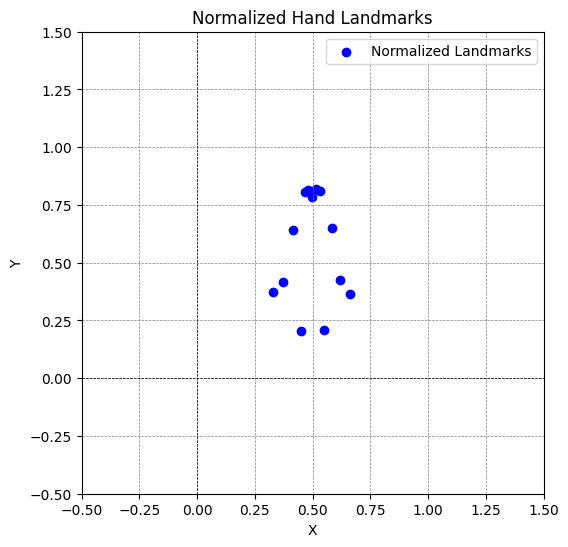

[0.49823058 0.78645433 0.51396637 0.81818182 0.48108458 0.81588532
 0.53054825 0.81043009 0.46615852 0.80660518 0.58332173 0.64684506
 0.41667827 0.64381095 0.61838387 0.42377851 0.38165761 0.41220704
 0.66282465 0.365352   0.33001524 0.37544184 0.54887989 0.21099643
 0.45117108 0.20621542]
[0.49855709 0.78634114 0.51434902 0.81818182 0.48134992 0.81587713
 0.53099005 0.81040244 0.46637061 0.80656388 0.58330168 0.64815048
 0.41669832 0.64313966 0.62034571 0.42329235 0.37121814 0.41832208
 0.66373833 0.36373657 0.32974166 0.3738624  0.54938708 0.20883034
 0.45132971 0.20403228]
[[-0.037375352408012485, 0.1168711839285149], [1.04162007915426, 1.1059503295272646]]


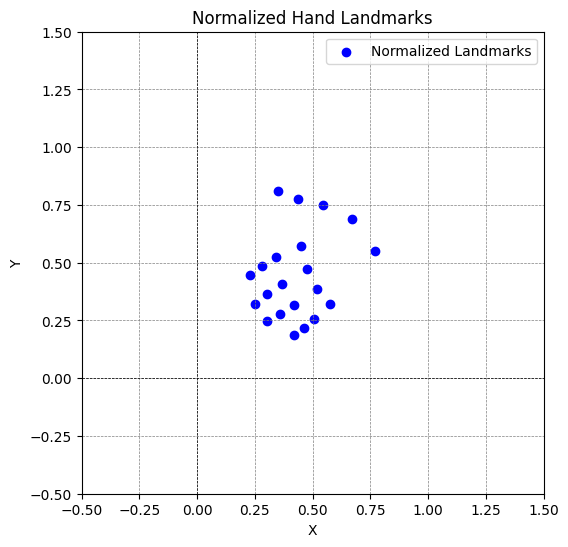

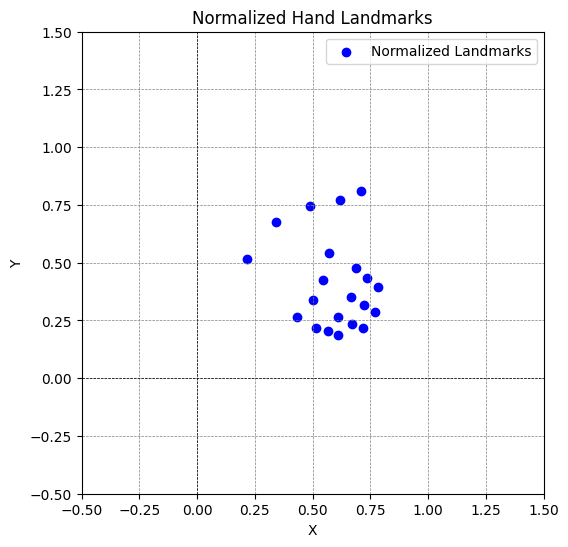

In [ ]:
plot_normalized_landmarks(f3, f4)
print(d)
print(f3)
print(f4)
plot_normalized_landmarks(f1[0], f2[0])
plot_normalized_landmarks(f1[1], f2[1])

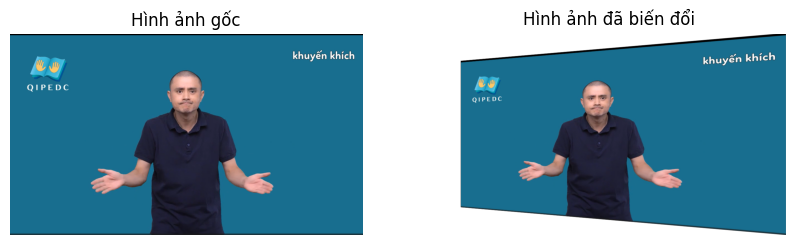

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2
def apply_perspective_transform(image_path):
    # Mở hình ảnh
    image = Image.open(image_path)
    image_width, image_height = image.size

    # Điểm nguồn và điểm đích cho phép biến đổi
    src = np.array([[0, image_height], [image_width, image_height], [0, 0], [image_width, 0]], dtype=np.float32)
    # dest = np.array([[0 + move_left, 1], [1 - move_right, 1], [0 + move_left, 0], [1 - move_right, 0]], dtype=np.float32) Thay đổi chiều rộng
    #  dest = np.array([[move_ratio, 1 - move_ratio], [1, 1], [move_ratio, move_ratio], [1, 0]], dtype=np.float32) Thay đổi chiều rộng và cao bên trái
    # dest = np.array([[0, image_height], [image_width - 100, image_height - 100], [0, 0], [image_width - 100, 100]],dtype=np.float32) Thay đổi chiều rộng và cao của bên phải
    dest = np.array([[100, image_height - 100], [image_width, image_height], [100, 100], [image_width, 0]],
                    dtype=np.float32)

    # Tính ma trận biến đổi
    matrix = cv2.getPerspectiveTransform(src, dest)

    # Chuyển đổi hình ảnh thành định dạng numpy
    image_np = np.array(image)

    # Áp dụng biến đổi
    transformed_image = cv2.warpPerspective(image_np, matrix, (image_width, image_height))

    # Hiển thị kết quả
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image_np)
    plt.title("Hình ảnh gốc")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(transformed_image)
    plt.title("Hình ảnh đã biến đổi")
    plt.axis("off")

    plt.show()

# Gọi hàm với đường dẫn đến hình ảnh
apply_perspective_transform("/content/khuyenkhich.png")

In [ ]:
print(x_process[0])
results_rotated = augment_in_plain_rotation(x_process, 13)
print('rotated:', results_rotated[0])
results_squeezed = augment_squeeze(x_process)
print('squeezed:', results_squeezed[0])
results_perspective = augment_perspective_transformation(x_process)
print('persceptive:', results_perspective[0])
results_joint_rotated = augment_sequential_joint_rotation(x_process)
print('joint:', results_joint_rotated[0])
print('joint:', len(results_joint_rotated[0]['hand_landmarks'][0]))

{'hand_landmarks': [[NormalizedLandmark(x=0.39085066318511963, y=0.9752471446990967, z=-1.5405340336727136e-09, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4051264226436615, y=0.992608368396759, z=-0.0043470836244523525, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.41208913922309875, y=1.0208595991134644, z=-0.006661693099886179, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4141203761100769, y=1.0433560609817505, z=-0.008401583880186081, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.4140240550041199, y=1.0623043775558472, z=-0.009797216393053532, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.39829108119010925, y=1.0422707796096802, z=-0.0027937982231378555, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.39981916546821594, y=1.073187232017517, z=-0.0056542037054896355, visibility=0.0, presence=0.0), NormalizedLandmark(x=0.40246185660362244, y=1.0885542631149292, z=-0.008520759642124176, visibility=0.0, presence=0.0), NormalizedLandmark(

In [ ]:
print(x_process[0]['hand_landmarks'][0][0])
print(x_process[0]['hand_landmarks'][1][0])

NormalizedLandmark(x=0.37428465485572815, y=0.9294882416725159, z=-1.1429572843724145e-08, visibility=0.0, presence=0.0)
NormalizedLandmark(x=0.5988785028457642, y=0.9345611333847046, z=6.218785841838326e-08, visibility=0.0, presence=0.0)


In [ ]:
import math
print(math.sqrt((0.6036815047264099 - 0.39791643619537354)**2 + (0.924636960029602 - 0.9673189520835876)**2))

0.21014522567329144


In [ ]:
norm_x = normalize_landmarks(x_process)
norm_x1 = normalize_landmarks(results_rotated)
norm_x2 = normalize_landmarks(results_squeezed)
norm_x3 = normalize_landmarks(results_perspective)
norm_x4 = normalize_landmarks(results_joint_rotated)

In [ ]:
print(norm_x.shape)
print(norm_x1.shape)
print(norm_x2.shape)
print(norm_x3.shape)
print(norm_x4.shape)
print(norm_x[1])
print("rotated:",norm_x1[0])
print("squeeze:",norm_x2[1])
print("pescep:",norm_x3[0])
print("joint:",norm_x4[0])


(130, 110)
(130, 110)
(130, 110)
(130, 110)
(130, 110)
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.44235772 0.8125     0.40843965 0.71471575 0.42028516 0.58517743
 0.44245806 0.48164289 0.47545847 0.4172408  0.41526387 0.49418374
 0.44208258 0.35233601 0.46431505 0.26694964 0.48085733 0.2043146
 0.46197516 0.49039369 0.49047165 0.34535289 0.5147464  0.25625851
 0.53109192 0.1875     0.51279662 0.49945797 0.5338099  0.36434356
 0.54968822 0.28391915 0.56195128 0.22145739 0.56626995 0.52027693
 0.57870364 0.40177016 0.58542543 0.33141052 0.59156035 0.27580942
 0.49951623 0.80783917 0.51387974 0.83333333 0.48276692 0.831856

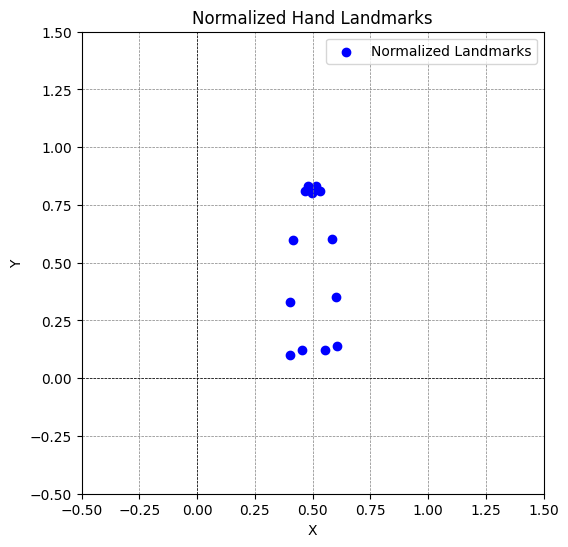

In [ ]:
plot_normalized_landmarks(norm_x2[0][84:], 3)

In [ ]:
print([[1,1],[2,2]])
print(np.array([[1,1],[2,2]]))

[[1, 1], [2, 2]]
[[1 1]
 [2 2]]


In [ ]:
import torch
import torch.nn.functional as F
tokens = torch.tensor([[1, 2, 3], [4, 5, 6]])  # shape (batch, n_ctx)
logits = torch.randn(2, 3,  10)  # shape (batch, n_ctx, n_vocab)
sum_logprobs = torch.tensor([0.8, 1.2])
eot = 9
next_tokens = logits[:,-1].argmax(dim=-1)  # shape (batch,)
print(next_tokens)
logprobs = F.log_softmax(logits.float(), dim=-1)
print(next_tokens.shape)
print(logprobs.shape)
print(tokens[:,-1:].shape)
#current_logprobs = logprobs[torch.arange(logprobs.shape[0]), next_tokens]

print(logits[:,-1:].shape)

tensor([6, 6])
torch.Size([2])
torch.Size([2, 3, 10])
torch.Size([2, 1])
torch.Size([2, 1, 10])


In [ ]:
tokens1 = tokens.repeat_interleave(1, dim = 0)
print(tokens1.shape)

torch.Size([2, 3])


In [ ]:
audio_features = torch.tensor([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

print(audio_features[::3])

tensor([ 1,  4,  7, 10])


In [ ]:
s = [torch.tensor([1, 2, 3, 4, 5, 5, 6, 7, 8]),
     torch.tensor([9, 10, 11, 5, 12, 13])]

[t[2 : (t == 5).nonzero()[0, 0]] for t in s]
x = [(t == 5).nonzero()[0, 0] for t in s]
print(x)
sum_logprobs  = torch.zeros(3, device=audio_features.device)
print(sum_logprobs)

[tensor(4), tensor(3)]
tensor([0., 0., 0.])
